**Data mining Project - University of Pisa, acedemic year 2023/24**
 
**Authors**: Giacomo Aru, Giulia Ghisolfi, Luca Marini, Irene Testa

# K-Means clustering

K-means clustering is a simple and efficient partitional clustering algorithm. It starts from k initial centroids (where k is a user-specified parameter) and operates by iteratively assigning each data point to the cluster whose centroid is closest according to a specific distance metric (e.g. the euclidean distance). Centroids are updated at the end of each iteration based on the newly formed clusters.

In this notebook, we will use the K-means algorithm to cluster the incidents dataset using the indicators previously extracted.

We import the libraries:

In [2]:
import json
import os
import sys
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import plotly.express as px
import plotly.offline as pyo
import warnings
np.warnings = warnings
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score, silhouette_score, silhouette_samples
from sklearn.cluster import KMeans, BisectingKMeans
from pyclustering.cluster.xmeans import xmeans, splitting_type
from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer
from yellowbrick.cluster import KElbowVisualizer, InterclusterDistance
sys.path.append(os.path.abspath('..'))
from plot_utils import *
from clustering_utils import *
%matplotlib inline
pd.set_option('display.max_columns', None)
pd.set_option('max_colwidth', None)

We load the data and prepare it for the clustering:

In [3]:
# load the data
incidents_df = pd.read_csv('../data/incidents_indicators.csv', index_col=0)
# load the names of the features to use for clustering
features_to_cluster = json.loads(open('../data/indicators_names.json').read())
# for clustering we will use all the extracted indicators except the projected coordinates
features_to_cluster = [feature for feature in features_to_cluster if feature not in ['lat_proj', 'lon_proj']]
# drop nan
incidents_df = incidents_df.dropna(subset=features_to_cluster)
# initialize a colum for the clustering labels
incidents_df['cluster'] = None
# project on the indicators
indicators_df = incidents_df[features_to_cluster]

We apply MinMaxScaler and StandardScaler to the data, visualizing the results of the transformations:

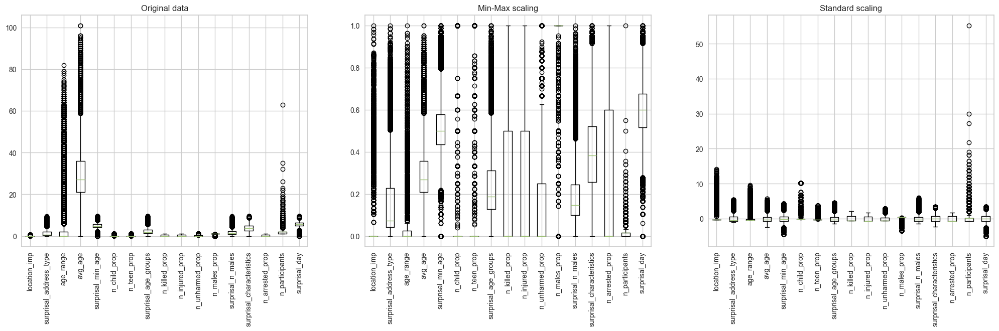

In [4]:
# apply MinMaxScaler
minmax_scaler = MinMaxScaler()
X_minmax = minmax_scaler.fit_transform(indicators_df.values)
# apply StandardScaler
std_scaler = StandardScaler()
X_std = std_scaler.fit_transform(indicators_df.values)
# plot the distributions of the indicators after the transformations
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(25, 6))
axs[0].boxplot(indicators_df.values)
axs[0].set_xticklabels(features_to_cluster, rotation=90);
axs[0].set_title('Original data');
axs[1].boxplot(X_minmax)
axs[1].set_xticklabels(features_to_cluster, rotation=90);
axs[1].set_title('Min-Max scaling');
axs[2].boxplot(X_std)
axs[2].set_xticklabels(features_to_cluster, rotation=90);
axs[2].set_title('Standard scaling');

Variables have different scales and variances. There are both advantages and disadvantages in using Min-Max scaling or Standard scaling. Min-Max scaling leaves variances unequal, but it preserves the shape of the original distribution. Standard scaling makes the variances equal, but it does not preserve the shape of the original distribution. Since K-means tends to produce globular clusters, leaving variances unequal is like giving different weights to features based on their variance. At the same time, using Standard scaling the feature n_participants, that is in a completely different range from the other features, is likely to negatively affect the clustering results. We decide to use Min-Max scaling because we want to keep the feature n_participants and becuase the features with higher interquartile range (e.g. n_killed_prop, n_injured_prop, n_unharmed_prop, n_arrested_prop), that could be weighted more in the clustering, are actually the ones describing the main characteristics of the incidents.

In [5]:
X = X_minmax

Below we define the parameters of the k-means algorithm:
- 300 iterations should be enough to converge (it is the default parameter of the scikit-learn implementation)
- the algorithm is run 10 times with different initializations and the best result in terms of SSE is chosen (10 runs is the default parameter of the scikit-learn implementation)
- initial centroids are sampled based on an empirical probability distribution of the points’ contribution to the overall inertia (this method is called k-means++ and again it is the default parameter of the scikit-learn implementation)
- the maximum number of K to later be evaluated is 30 (higher values lead to results that are difficult to interpret)
- we fixed the random seed to make the results reproducible
- the scikit-learn implementation of k-means uses the euclidean distance as distance metric

In [6]:
MAX_ITER = 300
N_INIT = 10
INIT_METHOD = 'k-means++'
MAX_K = 30
RANDOM_STATE = 42

## Identification of the best value of k

The following function uses the implementation of the elbow method from the library [Yellowbrick](https://www.scikit-yb.org/en/latest/index.html), to identify the best value of k. This method consists in computing a metric to evaluate the quality of the clustering for each value of k, and then plotting the metric as a function of k. The best value of k is the one that corresponds to the point of inflection of the curve (the point where the metric starts to decrease more slowly).

In [7]:
def apply_k_elbow_method(X, kmeans_params, metric, start_k, max_k, plot_elbow=True):
    if metric == 'SSE':
        metric = 'distortion'
        metric_descr = 'SSE'
    elif metric == 'calinski_harabasz':
        metric_descr = 'Calinski Harabasz Score'
    elif metric == 'silhouette':
        metric_descr = 'Silhouette Score'
    else:
        raise ValueError('Metric not supported')
    
    _, axs = plt.subplots(nrows=1, ncols=len(max_k) if len(max_k)!= 1 else 2, figsize=(30,5))

    for i in range(len(max_k)):
        kmeans_params['n_clusters'] = i
        kmeans = KMeans(**kmeans_params)

        elbow_vis = KElbowVisualizer(kmeans, k=(start_k, max_k[i]), metric=metric, timings=False, ax=axs[i], locate_elbow=plot_elbow)
        elbow_vis.fit(X)
        axs[i].set_title(f'{metric_descr} elbow for K-Means clustering (K in [{str(start_k)}, {str(max_k[i]-1)}])')
        axs[i].set_ylabel(metric_descr)
        axs[i].set_xlabel('K')
        if plot_elbow:
            axs[i].legend([
                f'{metric_descr}',
                f'elbow at K = {str(elbow_vis.elbow_value_)}, {metric_descr} = {elbow_vis.elbow_score_:0.2f}'
            ])
        else:
            axs[i].legend([
                f'{metric_descr}'
            ])

        if len(max_k)==1:
            axs[1].remove()
    
    plt.show()

We apply the elbow method evaluating the SSE and computing the elbow for each value of k between 1 and 10, 1 and 20 and 1 and 30. We consider also k=1 (absence of clusters) and we repeat the analysis with k in different ranges because the inflection point of the curve could vary depending on the number of points the curve is made of.

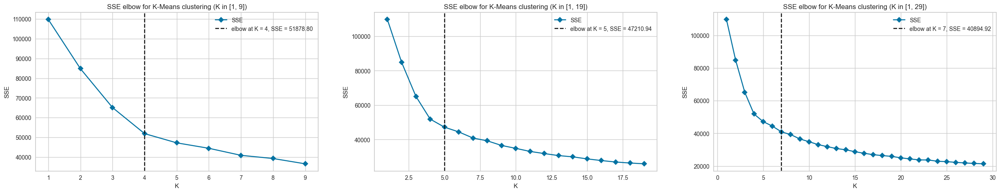

In [8]:
kmeans_params = {'init': INIT_METHOD, 'n_init': N_INIT, 'max_iter': MAX_ITER, 'random_state': RANDOM_STATE}
apply_k_elbow_method(X=X, kmeans_params=kmeans_params, metric='SSE', start_k=1, max_k=[10, 20, 30])

The elbow method identifies k=4, k=5 and k=7 as best possible values of k. At k=4 the point of inflection is more evident.

In [9]:
best_k = [4, 5, 7]

We repeat the analysis using the silhouette score.

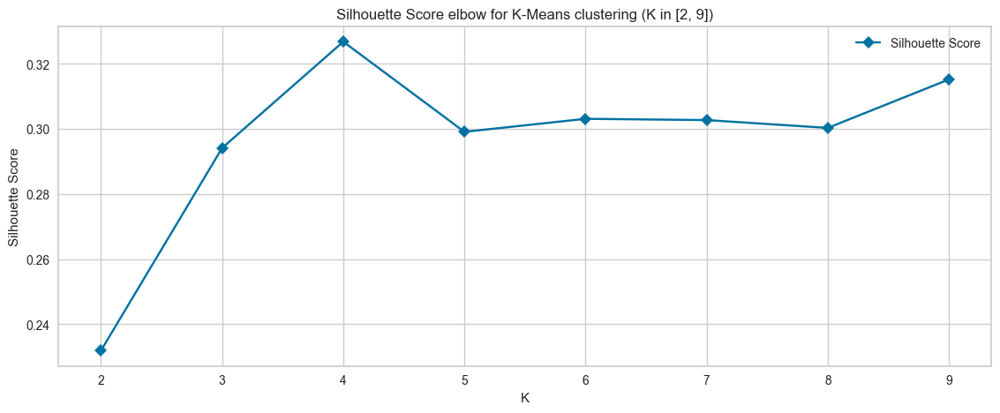

In [10]:
apply_k_elbow_method(X=X, kmeans_params=kmeans_params, metric='silhouette', start_k=2, max_k=[10], plot_elbow=False)

The silhouette score has a global maximum for k=4.

We repeat again the analysing evaluating the Calinski-Harabasz score (the ratio of the sum of between-cluster dispersion and of within-cluster dispersion; the higher it is the better the clustering).

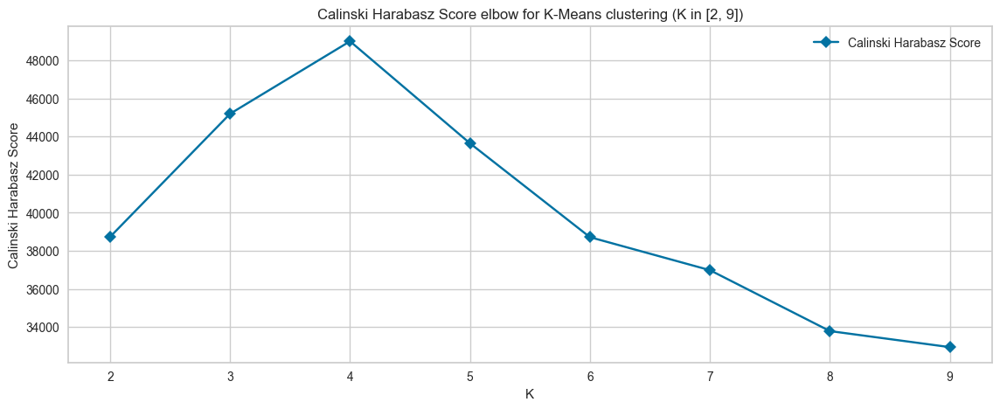

In [11]:
apply_k_elbow_method(X=X, kmeans_params=kmeans_params, metric='calinski_harabasz', start_k=2, max_k=[10], plot_elbow=False)

The Calinski-Harabasz score is maximum for k=4.

To identify the best value of k we also apply the X-means algorithm from the library [pyclustering](https://github.com/annoviko/pyclustering/). X-means is a variant of the k-means algorithm that should automatically find the best value of k. The algorithm starts with k=2 and then it iteratively splits the clusters until a score does not improve anymore. The implementation we will use supports both the BIC score (Bayesian Information Criterion) and the Minimum Noiseless Description Length score (MDL):

In [12]:
initial_centers = kmeans_plusplus_initializer(data=X, amount_centers=1, random_state=RANDOM_STATE).initialize()
xmeans_MDL_instance = xmeans(
    data=X,
    initial_centers=initial_centers,
    kmax=MAX_K,
    splitting_type=splitting_type.BAYESIAN_INFORMATION_CRITERION,
    random_state=RANDOM_STATE
)
xmeans_MDL_instance.process()
n_xmeans_BIC_clusters = len(xmeans_MDL_instance.get_clusters())
print(f'Number of clusters found by xmeans using BIC score and setting the maximum number of clusters to {MAX_K}: {n_xmeans_BIC_clusters}')

Number of clusters found by xmeans using BIC score and setting the maximum number of clusters to 30: 30


In [13]:
xmeans_MDL_instance = xmeans(
    data=X,
    initial_centers=initial_centers,
    kmax=MAX_K,
    splitting_type=splitting_type.MINIMUM_NOISELESS_DESCRIPTION_LENGTH,
    random_state=RANDOM_STATE
)
xmeans_MDL_instance.process()
n_xmeans_MDL_clusters = len(xmeans_MDL_instance.get_clusters())
print(f'Number of clusters found by xmeans using MDL score and setting the maximum number of clusters to {MAX_K}: {n_xmeans_MDL_clusters}')

Number of clusters found by xmeans using MDL score and setting the maximum number of clusters to 30: 30


X-means terminates with k equal to the maximum number of clusters allowed (30 in our case). This means that the score always improved when splitting the clusters. No value of k is optimal according to these criteria.

To choose the best value of k among the ones identified by the elbow method, we will compute other metrics to evaluate the quality of the clustering. The following function fits the k-means algorithm with a given set of parameters and computes the following metrics:
- SSE
- BSS (i.e. between-cluster sum of squares; the higher the better)
- Davies-Bouldin score (i.e. the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances; the lower the better)
- Calinski-Harabasz score
- Silhouette score

In [14]:
def fit_kmeans(X, params):
    print(f"Fitting KMeans with k={params['n_clusters']}")
    kmeans = KMeans(**params)
    kmeans.fit(X)
    results = {}
    results['model'] = kmeans
    results['SSE'] = kmeans.inertia_
    results['BSS'] = compute_bss_per_cluster(X=X, clusters=kmeans.labels_, centroids=kmeans.cluster_centers_, weighted=True).sum()
    results['davies_bouldin_score'] = davies_bouldin_score(X=X, labels=kmeans.labels_)
    results['calinski_harabasz_score'] = calinski_harabasz_score(X=X, labels=kmeans.labels_)
    results['silhouette_score'] = silhouette_score(X=X, labels=kmeans.labels_) 
    results['n_iter'] = kmeans.n_iter_
    return results

We apply that function using the best values of k, saving the results in a dictionary:

In [15]:
results = {}
kmeans_params = {}
kmeans_params['random_state'] = RANDOM_STATE
kmeans_params['max_iter'] = MAX_ITER
best_k = sorted(best_k)
for k in best_k:
    kmeans_params['n_init'] = N_INIT
    kmeans_params['n_clusters'] = k
    kmeans_params['init'] = INIT_METHOD
    result = fit_kmeans(X=X, params=kmeans_params)
    results[str(k)+'means'] = result

Fitting KMeans with k=4
Fitting KMeans with k=5
Fitting KMeans with k=7


In [16]:
results_df = pd.DataFrame(results).T
results_df.drop(columns=['model'])

,SSE,BSS,davies_bouldin_score,calinski_harabasz_score,silhouette_score,n_iter
4means,51878.798453,57863.918708,1.212993,49004.186717,0.326803,6
5means,47210.942099,62529.604692,1.456076,43644.701959,0.299111,6
7means,40894.919606,68847.354336,1.397458,36982.510661,0.302721,21


We observe that:
- SSE and BSS are both best for k=7, but these metrics are expected to improve while increasing the number of clusters
- Davies-Bouldin score is best for k=4
- Calinski-Harabasz score is best for k=4
- Silhouette score is best for k=4


We could have also used hierarchical clustering to identify the best value of k. However, because of the high computational cost of hierarchical clustering, we should have used a subset of the data. Furthermore, since the methods we used so far are concordant in identifying k=4 as the best value of k, we decided to conclude the analysis here and use k=4 for the final clustering.

In [17]:
k = 4
kmeans = results[f'{k}means']['model']
clusters = results[f'{k}means']['model'].labels_
centroids = results[f'{k}means']['model'].cluster_centers_
inverse_centroids = minmax_scaler.inverse_transform(centroids)
incidents_df['cluster'] = clusters

We visualize the size of the clusters:

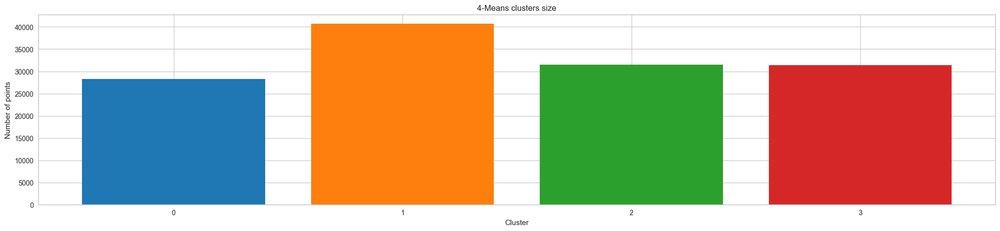

In [18]:
fig, axs = plt.subplots(1, figsize=(25,5))
plot_clusters_size(clusters=clusters, ax=axs, title=f'{k}-Means clusters size', color_palette=sns.color_palette('tab10'))

Cluster 1 is the biggest, however clusters are not too much unbalanced.

## Characterization of the clusters

We visualize the centroids with a parallel coordinates plot:

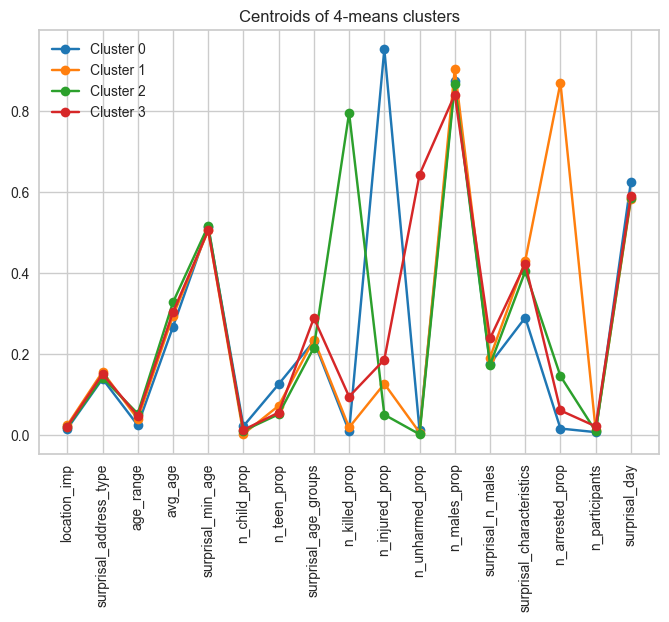

In [19]:
for j in range(0, len(centroids)):
    plt.plot(centroids[j], marker='o', label='Cluster %s' % j, c=sns.color_palette('tab10')[j])
plt.tick_params(axis='both', which='major', labelsize=10)
plt.xticks(range(0, len(features_to_cluster)), features_to_cluster, rotation=90)
plt.legend(fontsize=10)
plt.title(f'Centroids of {k}-means clusters');

We observe that some feature do not vary much between the clusters (i.e. location_imp, surprisal_address_type, age_range, avg_age, surprisal_min_age, n_child_prop, n_males_prop, suprisal_n_males, surprisal_day).

Regarding the centroids, we observe that:
- The centroid of cluster 0 has an higher proportion of injured people and teens; the values of surprisal_characteristics and the proportion of arrested people, instead, are lower.
- The centroid of cluster 1 has an higher proportion of arrested people.
- The centroid of cluster 2 has an higher proportion of killed people and a lower proportion of injured people.
- The centroid of cluster 3 has an higher proportion of unharmed people.

We visualize the same information using a interactive radar plot:

In [20]:
def plot_spider(points, features, title=None, palette=sns.color_palette()):
    df = pd.DataFrame()
    for i, center in enumerate(points):
        tmp_df = pd.DataFrame(dict(r=center, theta=features))
        tmp_df['Centroid'] = f'Centroid {i}'
        df = pd.concat([df,tmp_df], axis=0)

    with warnings.catch_warnings():
        warnings.simplefilter("ignore", FutureWarning)
        fig = px.line_polar(df, r='r', theta='theta', line_close=True, color='Centroid', color_discrete_sequence=palette.as_hex())
    fig.update_layout(title=title)
    fig.show()
    pyo.plot(fig, filename=f'../html/centroids_spider.html', auto_open=False)

In [21]:
plot_spider(points=centroids, features=features_to_cluster, title=f'Centroids of {k}-means clusters', palette=sns.color_palette('tab10'))

## Distribution of variables within the clusters

We plot on a map the points in each cluster:

In [22]:
for i in range(k):
    fig = plot_scattermap_plotly(
        incidents_df[incidents_df['cluster']==i],
        'cluster',
        zoom=2.5,
        height=400,
        title=f'Cluster {i}',
        color_sequence=sns.color_palette('tab10').as_hex()[i:],
        black_nan=False,
        showlegend=False
    )
    fig.show()

Incidents are not clustered according to their geographical location.

Now we inspect the distribution of the most relevant categorical features within the clusters:

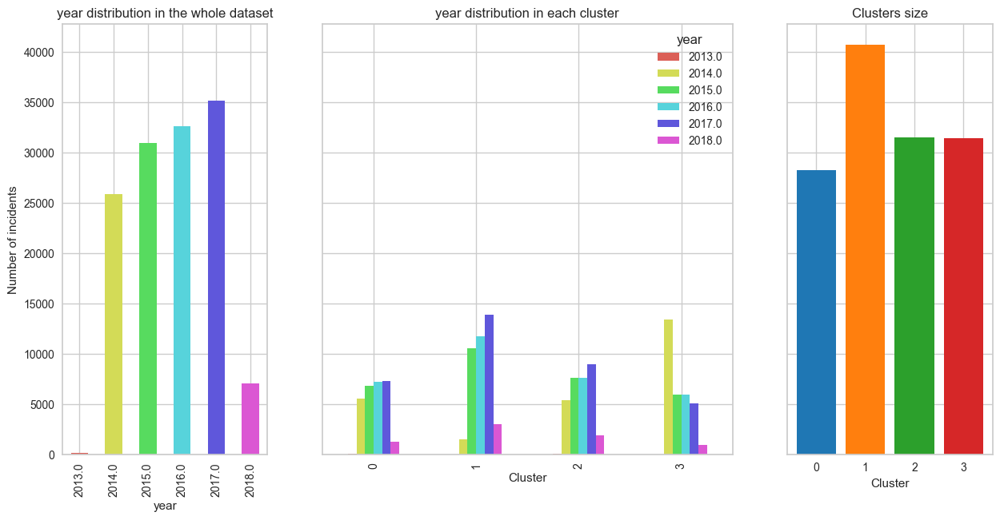

In [23]:
plot_bars_by_cluster(df=incidents_df, feature='year', cluster_column='cluster')

Cluster 1 - characterized by the highest value of n_arrestes_prop - contains fewer incidents happened in 2014. We can conclude that in 2014 less people where arrested.
Cluster 3 - characterized by the highest value of n_unharmed_prop - contains more incidents happend in 2014. This means that in 2014 incidents where less severe (and is likely that the smaller number of arrested is a consequence of this).

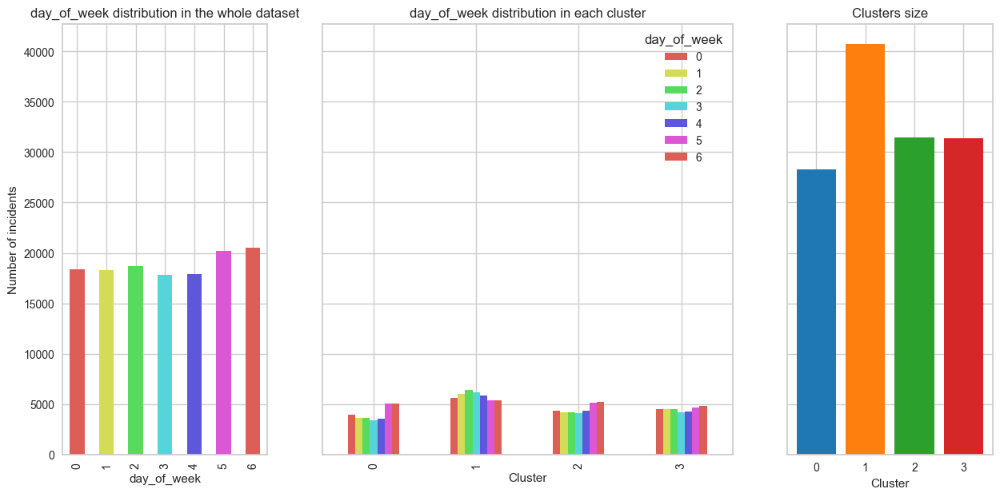

In [24]:
plot_bars_by_cluster(df=incidents_df, feature='day_of_week', cluster_column='cluster')

Cluster 1 - characterized by the highest value of n_arrestes_prop - exhibits a different distribution compared to the one in the whole dataset, with a pick on Wednesday instead of in the weekend. This deviation may be attributed to the police shift pattern.

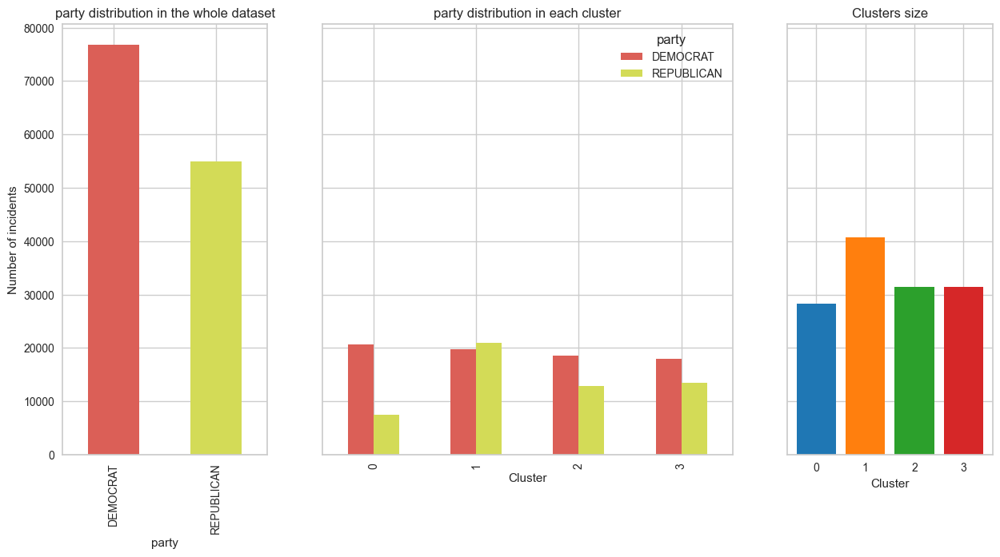

In [25]:
plot_bars_by_cluster(df=incidents_df, feature='party', cluster_column='cluster')

In cluster 1 - characterized by the highest value of n_arrestes_prop - the proportion of incidents happened in Republican states is higher than those happened in Democratic states. This is probably due to variations in the law enforcement policies.

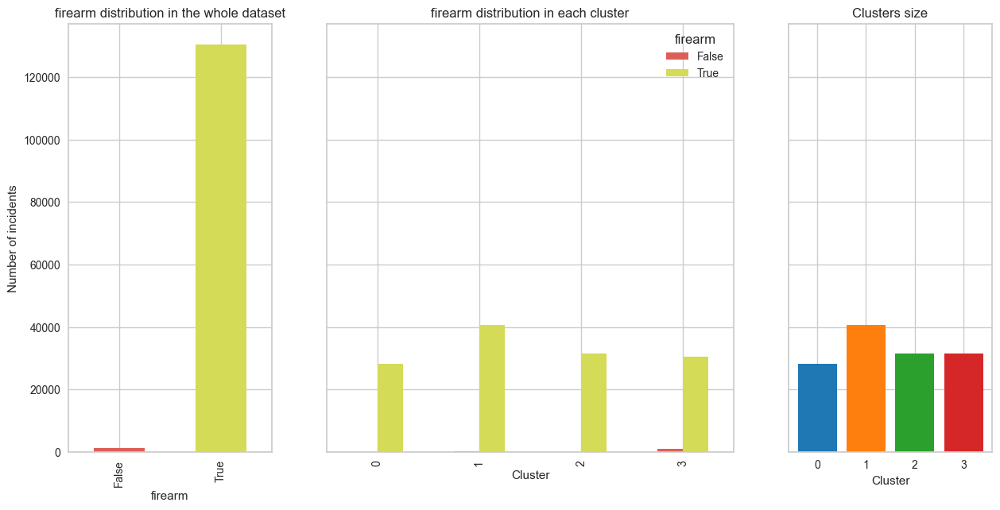

In [26]:
plot_bars_by_cluster(df=incidents_df, feature='firearm', cluster_column='cluster')

Cluster 3 - characterized by an higher proportion of unharmed people - has the highest number of incidents that did not involved firearms.

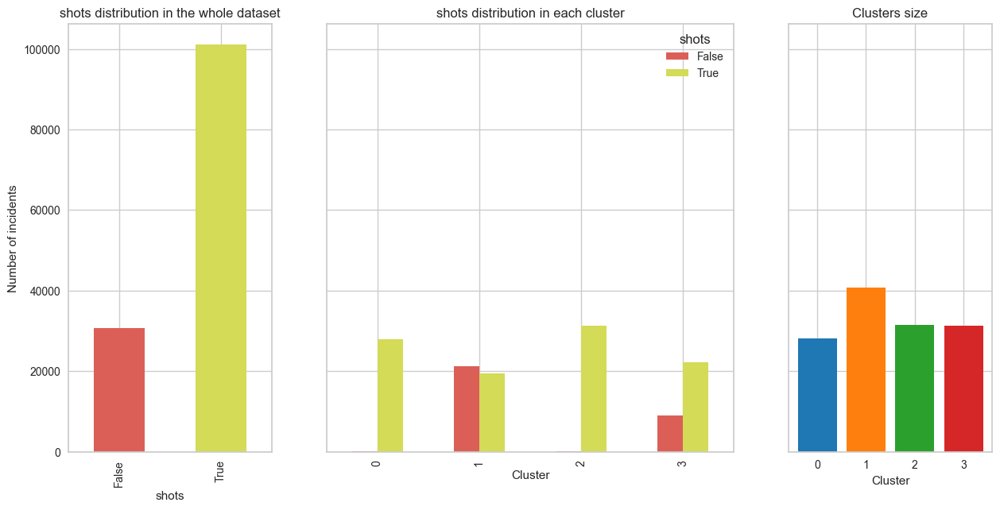

In [27]:
plot_bars_by_cluster(df=incidents_df, feature='shots', cluster_column='cluster')

In cluster 0 and cluster 2 - those with highest values of n_injured_prop and n_killed_prop - the majority of incidents were shooting incidents (as expected).

In cluster 1 - characterized by the highest value of n_arrestes_prop - the proportion of incidents that did not involved firearms is higher than in the whole dataset

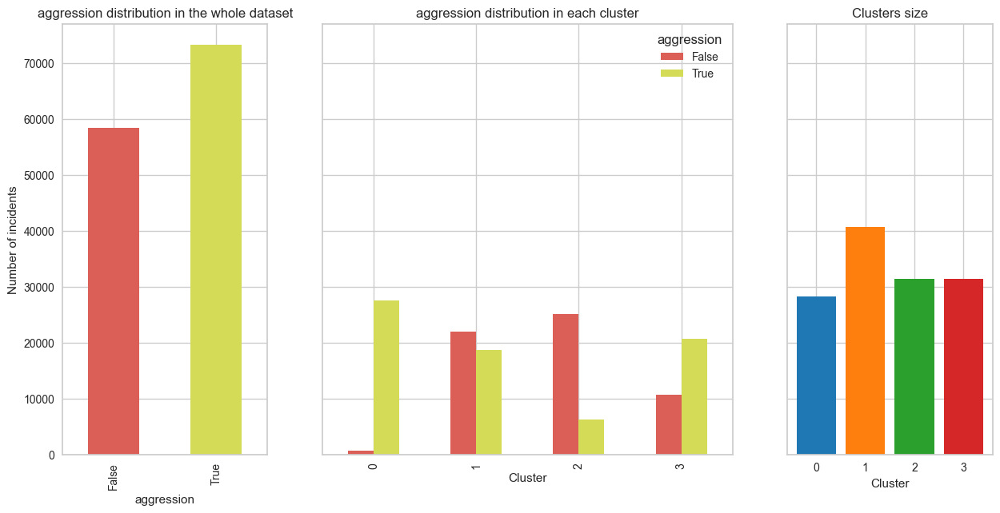

In [28]:
plot_bars_by_cluster(df=incidents_df, feature='aggression', cluster_column='cluster')

In cluster 0 - characterized by the highest value of n_injured_prop - most of the incidents involved an aggression.
In cluster 2 - characterized by the highest value of n_killed_prop - most of the incidents did not involved an aggression. This cluster could group suicide incidents. Let's check:

In [29]:
incidents_df[
    incidents_df['suicide']==True
]['cluster'].value_counts().rename_axis('cluster').reset_index(name='counts')

,cluster,counts
0,2,3368
1,0,133
2,3,70
3,1,49


The majority of incidents were actually suicides.

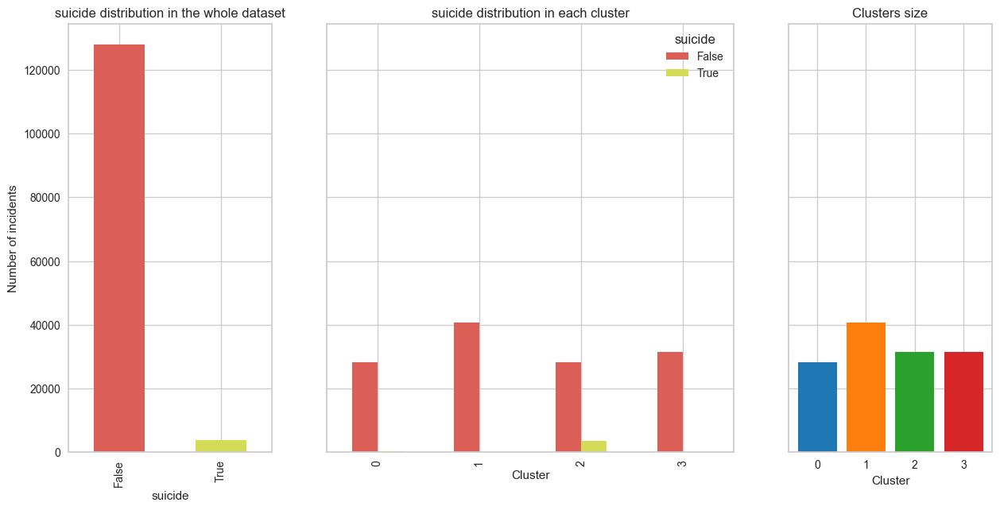

In [30]:
plot_bars_by_cluster(df=incidents_df, feature='suicide', cluster_column='cluster')

Again, most of suicidal incidents are in cluster 2. But this cluster also contains incidents that are not suicidal.

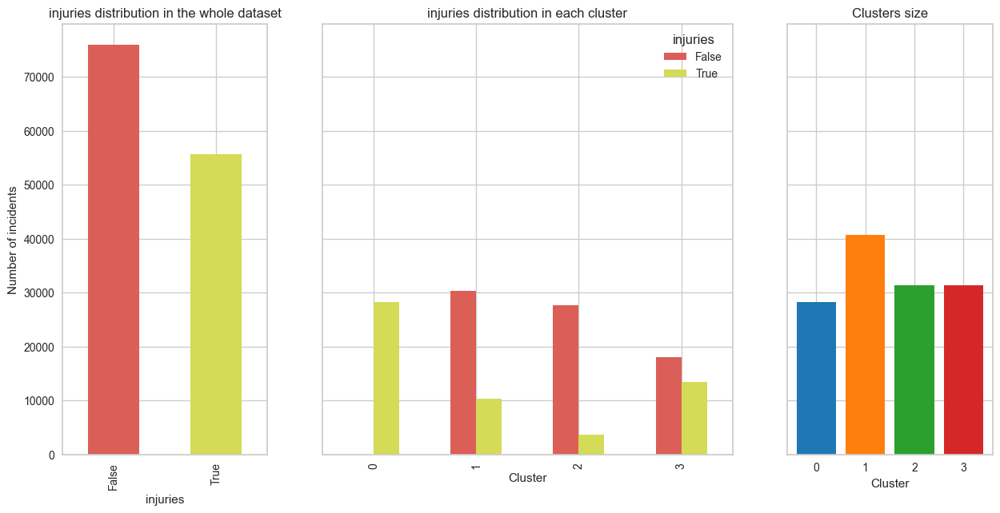

In [31]:
plot_bars_by_cluster(df=incidents_df, feature='injuries', cluster_column='cluster')

As expected, in cluster 0 - characterized by an higher proportion of injured people - incidentes involved injuries. In cluster 1 and 2 - characterized by an higher number of arrested and killed people respectively - the majority of the incidents did not involved injuries.

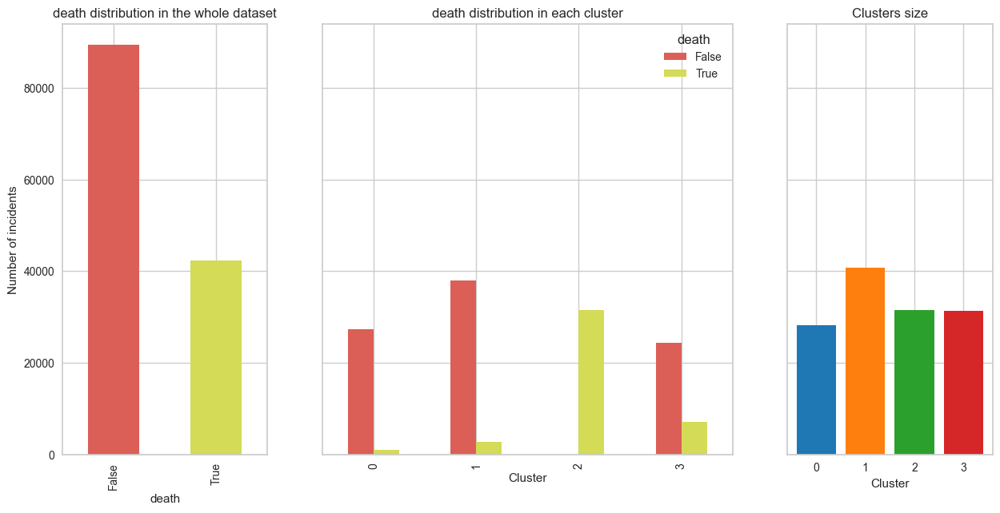

In [32]:
plot_bars_by_cluster(df=incidents_df, feature='death', cluster_column='cluster')

As expected cluster 2 - characterized by higher values of n_killed_prop - includes mortal incidents. 
In clusters 0 and 1 - characterized by higher values of n_injured_prop and n_arrested_prop - the proportion of non mortal incidents are remarkably higher compared to the whole dataset.

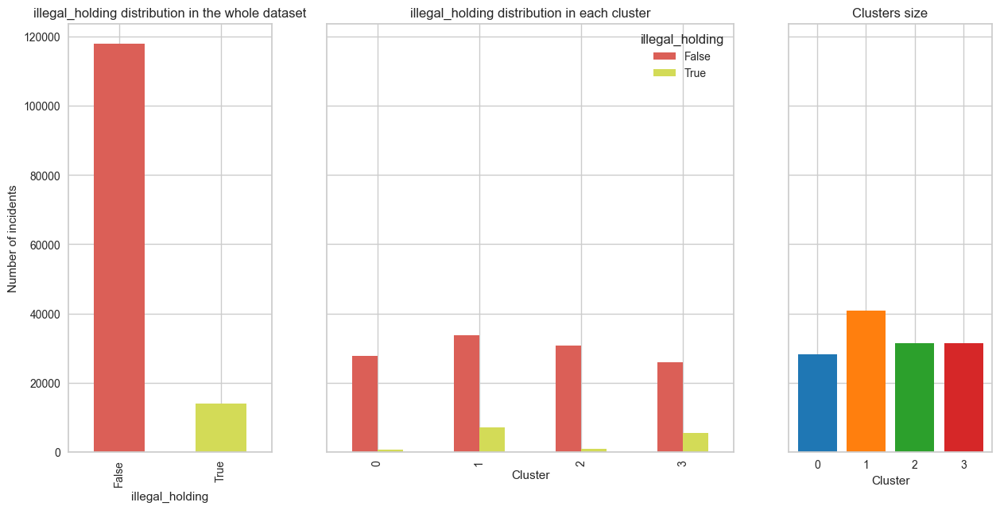

In [33]:
plot_bars_by_cluster(df=incidents_df, feature='illegal_holding', cluster_column='cluster')

Cluster 0 and cluster 2 - the one with highest value of n_injured_prop and n_killed_prop respectively - have fewer incidents in which participants were illegally armed.

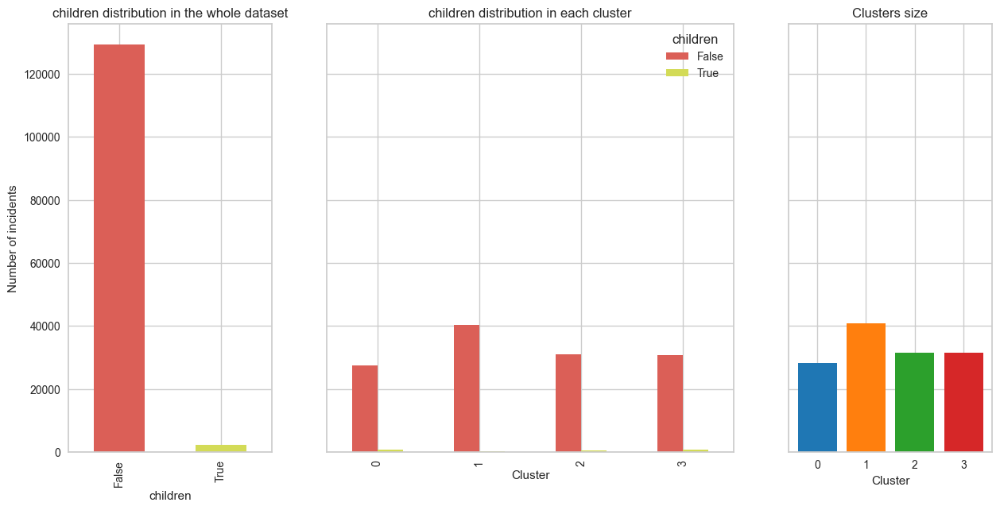

In [34]:
plot_bars_by_cluster(df=incidents_df, feature='children', cluster_column='cluster')

The distribution of incidents involving children in each cluster is similar to the one in the whole dataset.

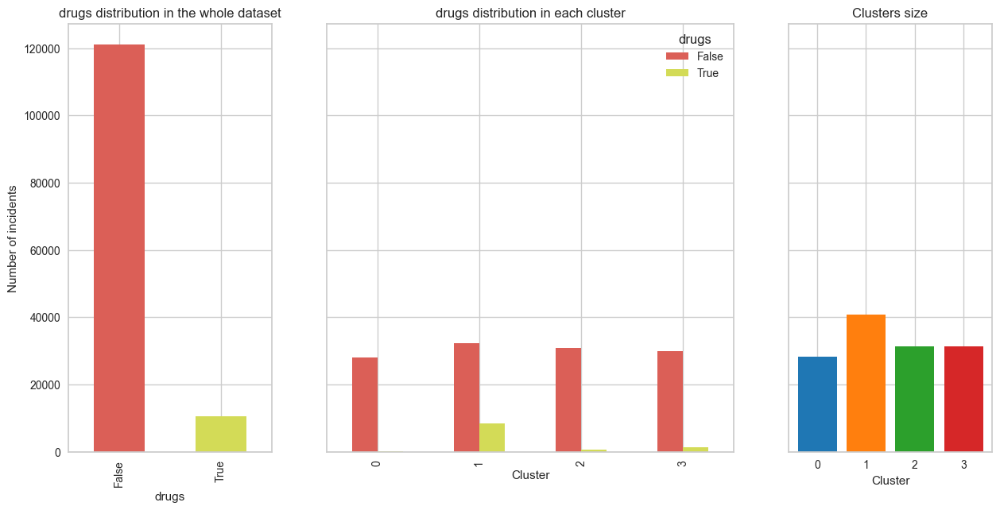

In [35]:
plot_bars_by_cluster(df=incidents_df, feature='drugs', cluster_column='cluster')

Cluster 1 - the one with the highest value of n_arrestes_prop - has an higher proportion of incidents involving drugs.

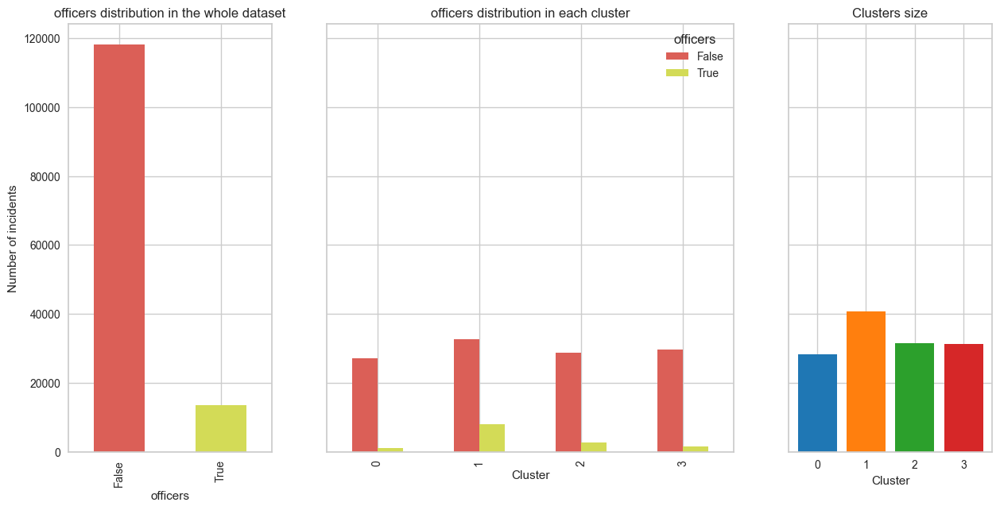

In [36]:
plot_bars_by_cluster(df=incidents_df, feature='officers', cluster_column='cluster')

Cluster 0 - characterized by an higher proportion of injured people and teens - the involvement of officers is proportionally lower than in the whole dataset.

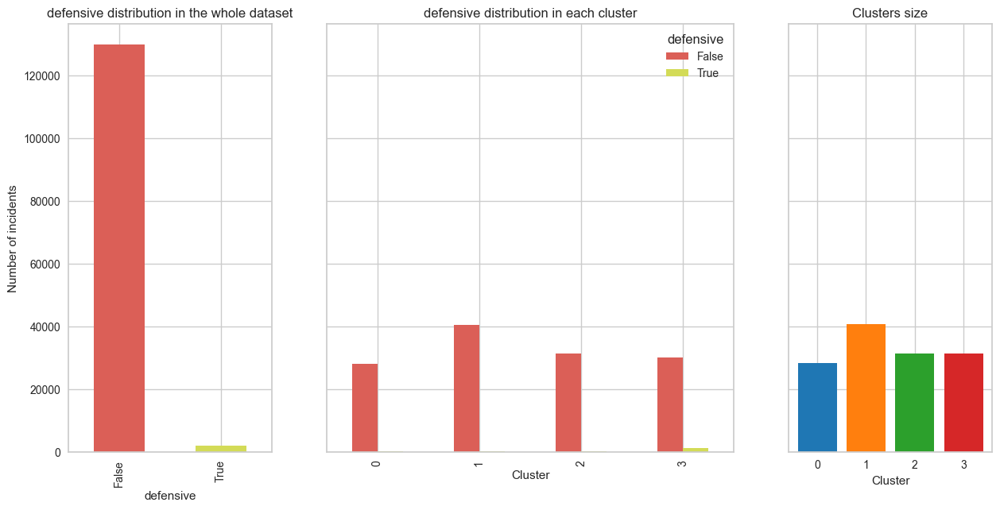

In [37]:
plot_bars_by_cluster(df=incidents_df, feature='defensive', cluster_column='cluster')

Most of the incidents with defensive use of firearms are in cluster 3 - the one with the highest value of n_unharmed_prop. Guns were probably used as a means of threat.

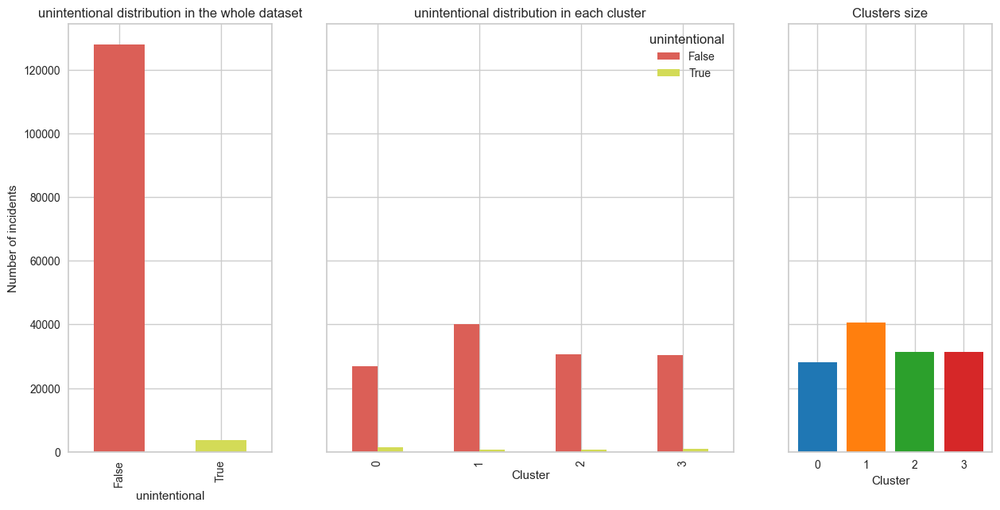

In [38]:
plot_bars_by_cluster(df=incidents_df, feature='unintentional', cluster_column='cluster')

The distribution of accidental incidents in the clusters is similar to the one in the whole dataset, cluster 0 - characterized by an higher proportion of injured people and teens - has also a slightly higher proportion of accidental incidents compared to the whole dataset. Maybe in those incidents teens were playing with guns.

We visualize the cluster in the bidimensional feature spaces obtained pairing some features used for the clustering:

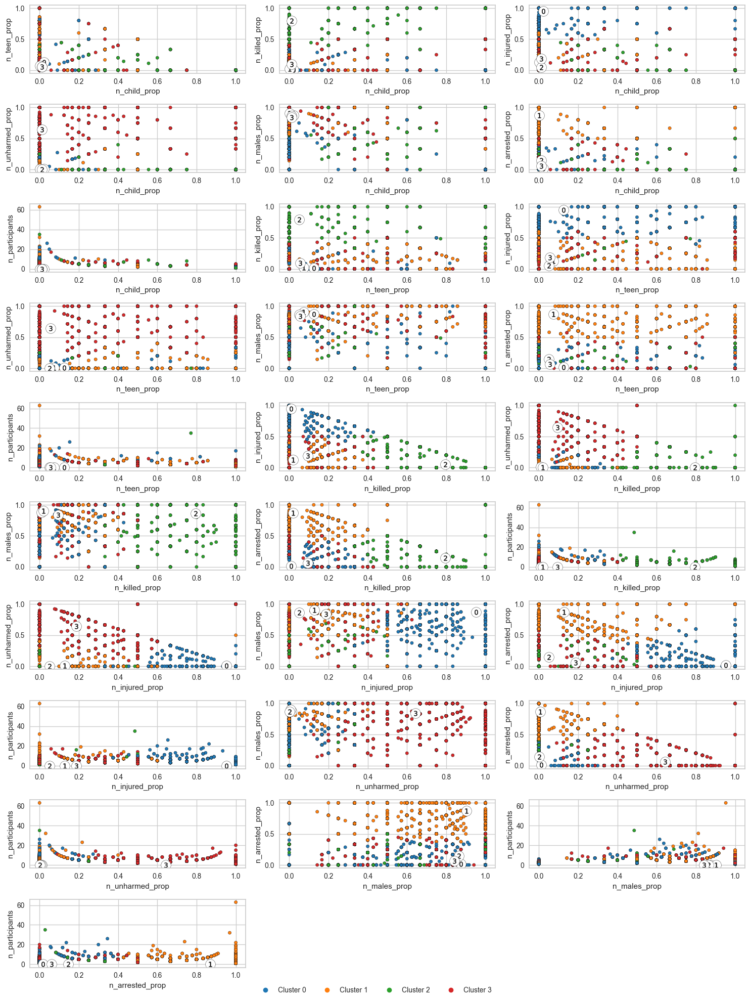

In [39]:
features_to_scatter = [
    'n_child_prop',
    'n_teen_prop',
    'n_killed_prop',
    'n_injured_prop',
    'n_unharmed_prop',
    'n_males_prop',
    'n_arrested_prop',
    'n_participants'
    ]
scatter_by_cluster(
    df=incidents_df,
    features=features_to_scatter,
    cluster_column='cluster',
    centroids=centroids[:, [features_to_cluster.index(feature) for feature in features_to_scatter]],
    figsize=(15, 20),
    ncols=3,
    color_palette=sns.color_palette('tab10')
)
plt.tight_layout()

As previously observed, clusters are actually separated according to the values of the following features: n_killed_prop, n_injured_prop, n_unharmed_prop, n_arrested_prop.

We apply the principal component analysis to the scaled matrix of indicators:

In [40]:
pca = PCA()
X_pca = pca.fit_transform(X)

We display the explained variance ratio of the components:

[0, 1, 2.5, 3.5, 4.5, 6.0, 7.0, 8.0, 9.5, 10.5, 12.0, 13.0, 14.5, 15.5, 16.5, 18.0]


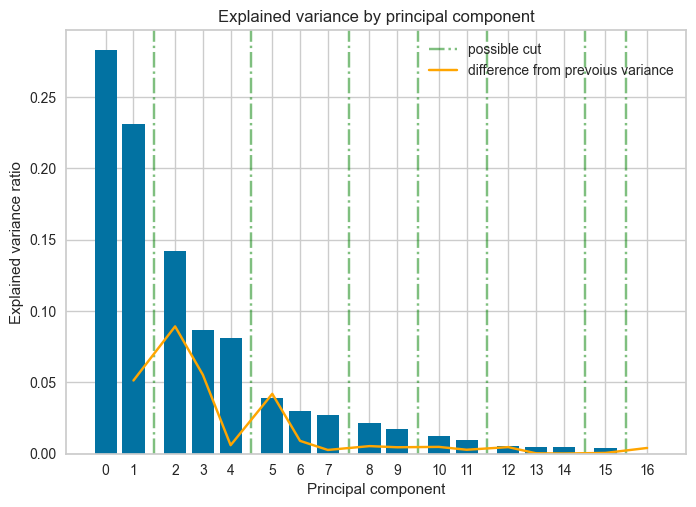

In [41]:
exp_var_pca = pca.explained_variance_ratio_

diff_var = []
for i, var in enumerate(exp_var_pca[:-1]):
    diff_var.append( var-exp_var_pca[i+1])
xtick = []
gap = 0
for i, var in enumerate(diff_var):
    xtick.append(i+gap)
    if i != 0 and diff_var[i-1] <= var:
        gap += 0.5
        if gap == 0.5:
            plt.axvline(x = i+gap+0.25, color = 'green', linestyle = '-.', alpha=0.5, label='possible cut')
        else:
            plt.axvline(x = i+gap+0.25, color = 'green', linestyle = '-.', alpha=0.5)
print(xtick)
xtick.append(xtick[-1]+1.5)

plt.bar(xtick, exp_var_pca, align='center')
plt.plot(xtick[1:], diff_var, label='difference from prevoius variance', color='orange')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component')
plt.title('Explained variance by principal component')
plt.xticks(xtick, range(exp_var_pca.shape[0]));
plt.legend();

The first 6 components contribute the most to the overall variance in the dataset.

We visualize the clusters in the feature spaces obtained by pairing the first 6 principal components:

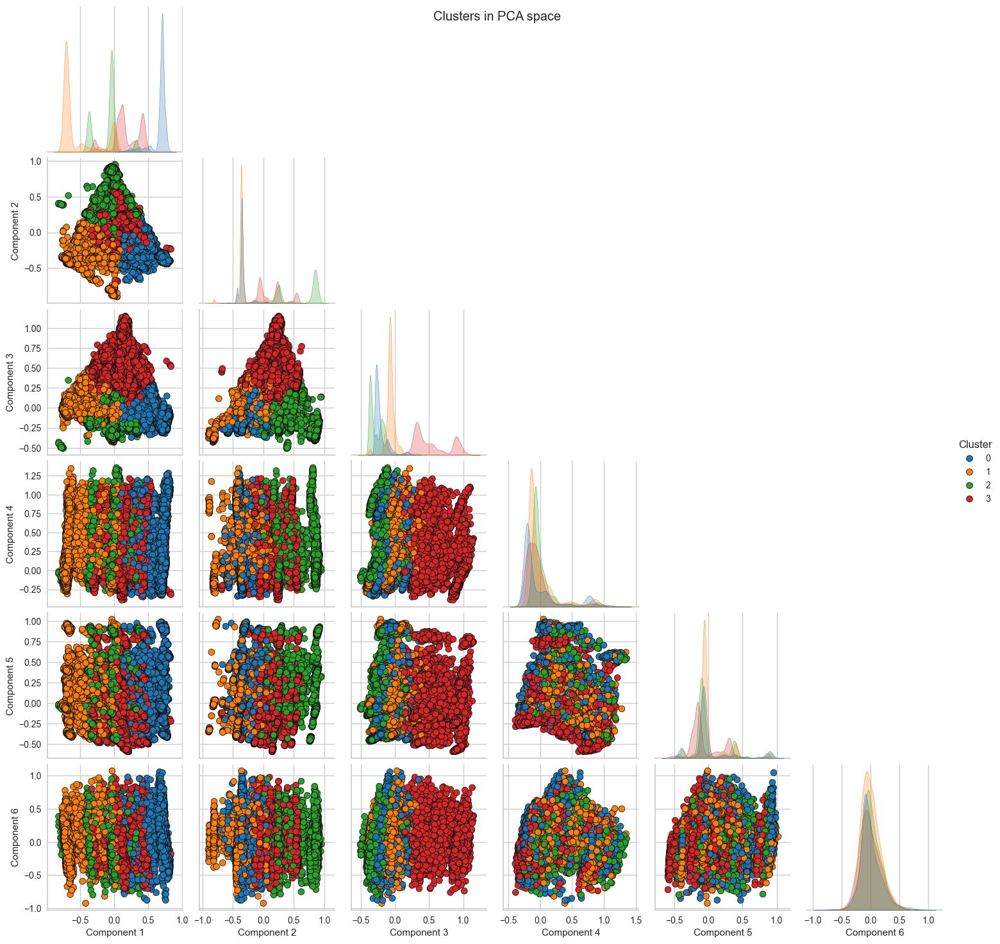

In [42]:
palette = [sns.color_palette('tab10')[i] for i in range(k)]
scatter_pca_features_by_cluster(
    X_pca=X_pca,
    n_components=6,
    clusters=clusters,
    palette=palette,
    hue_order=None,
    title='Clusters in PCA space'
)

In the feature spaces obtained by pairing the first 4 principal components, the clusters are well separated.

We now visualize the distributions of the features used to cluster the data in each cluster:

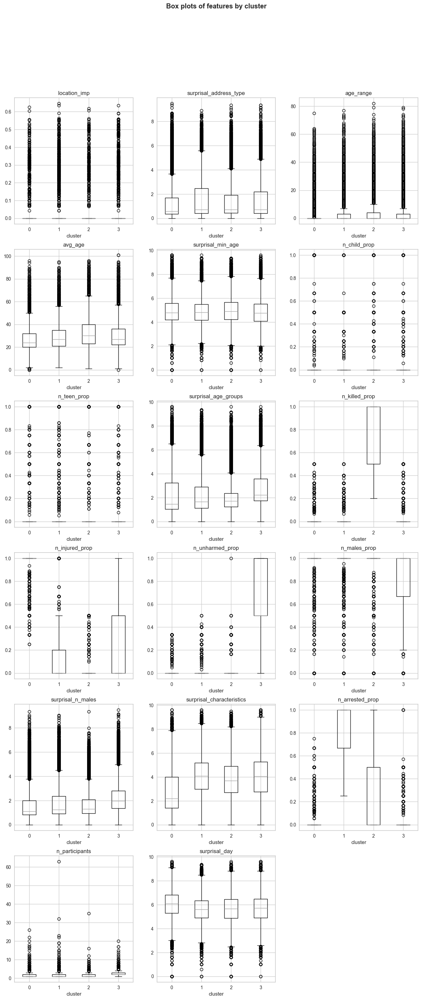

In [43]:
plot_boxes_by_cluster(
    df=incidents_df,
    features=features_to_cluster,
    cluster_column='cluster',
    figsize=(15, 35),
    title='Box plots of features by cluster'
)

All the observations made while observing the values of the indicators in the centroids still hold.
We notice that the values of n_males_prop is lower in cluster 3 (the cluster characterized also by an higher proportion of unharmed people).

Now we visualize the same information using histograms and comparing the distributions of features each cluster with the distribution in the whole dataset:

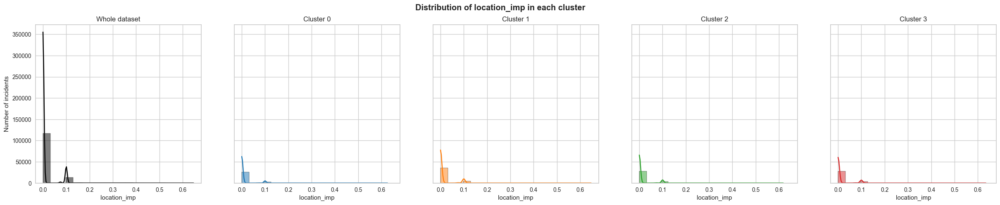

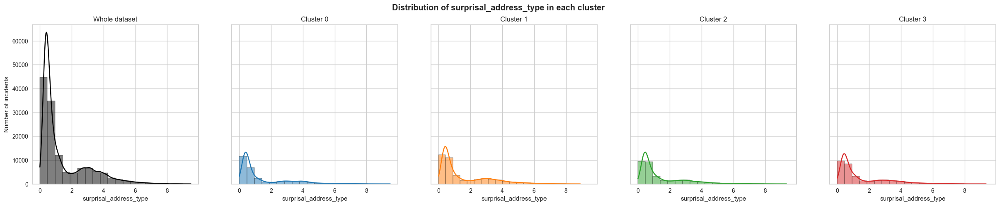

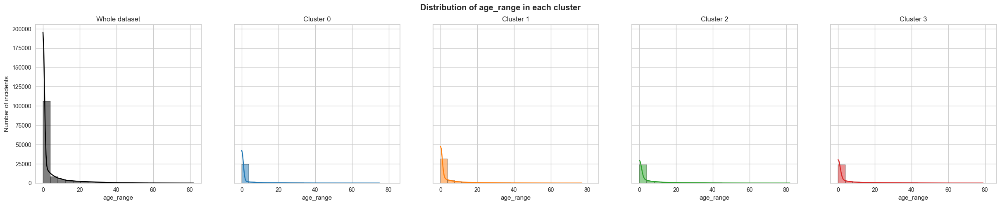

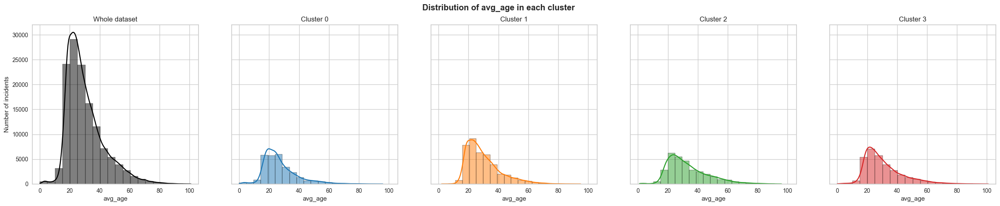

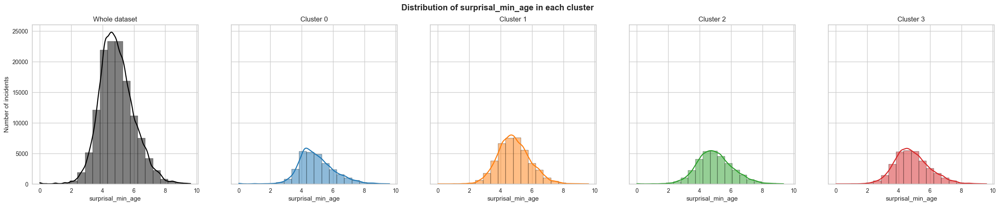

...

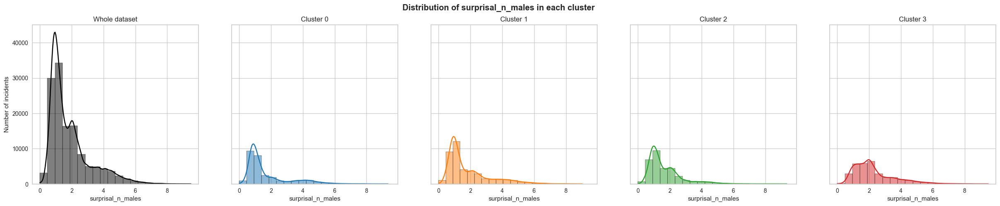

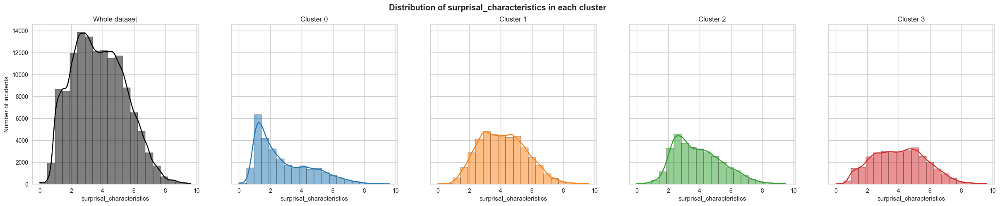

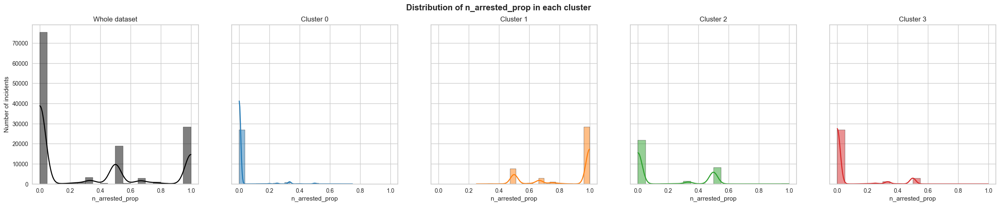

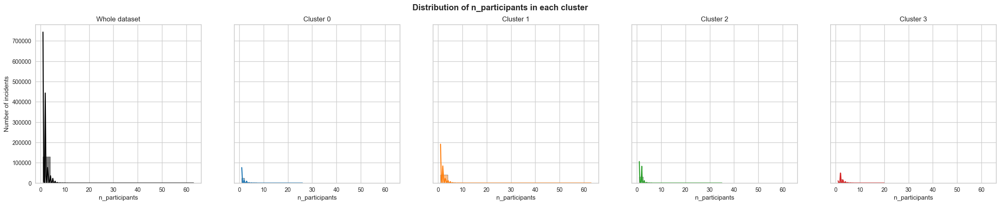

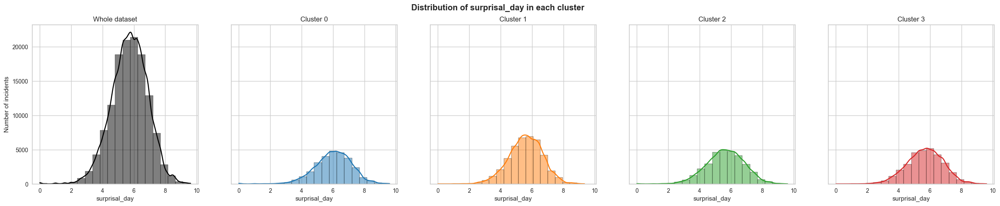

In [44]:
for feature in features_to_cluster:
    plot_hists_by_cluster(
        df=incidents_df,
        feature=feature,
        cluster_column='cluster',
        title=f'Distribution of {feature} in each cluster',
        color_palette=sns.color_palette('tab10'),
        figsize=(30, 5)
    )

This visualization does not provide additional information beyond what was already observed.

## Evaluation of the clustering results

### Internal indices

We compute and plot the silhouette score for each point:

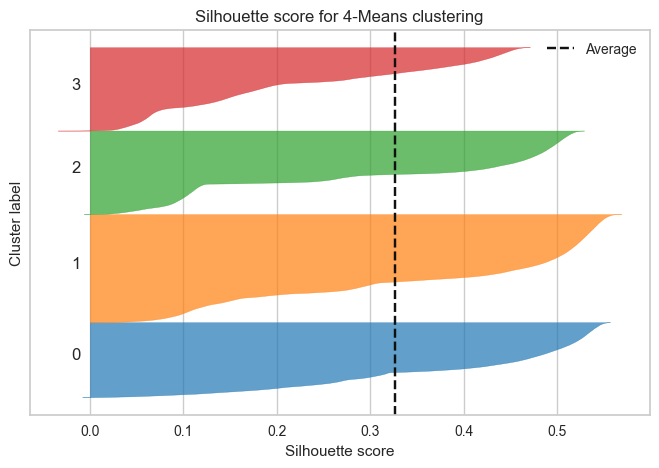

In [45]:
fig, axs = plt.subplots(1, figsize=(8,5))
silhouette_per_point = silhouette_samples(X=X, labels=clusters)
plot_scores_per_point(
    score_per_point=silhouette_per_point,
    clusters=clusters,
    score_name='Silhouette score', ax=axs,
    title=f'Silhouette score for {k}-Means clustering',
    color_palette=sns.color_palette('tab10'),
    minx=-0.02
)

Few points have a negative silhouette score. The majority of points with a negative silhouette score belong to cluster 3. Also, the majority of points of cluster 3 have a silhouette score below the average.

Now we color in black points with a negative silhouette score in the principal component feature space:

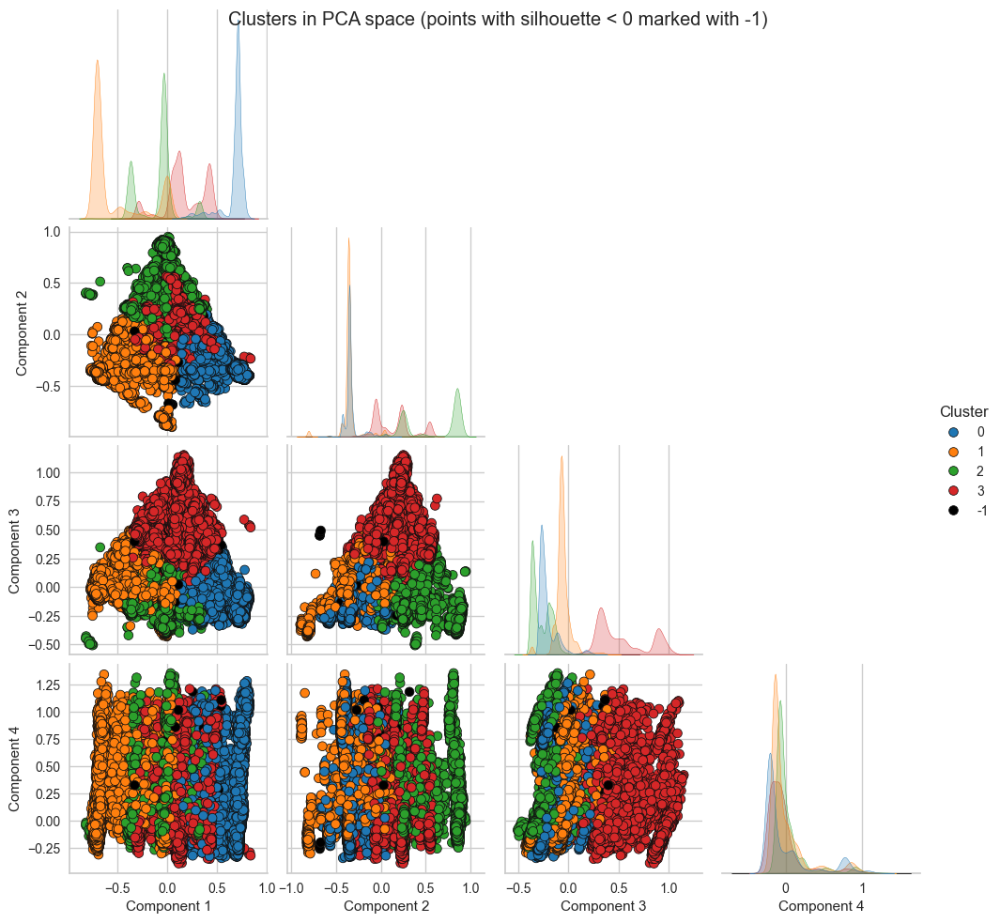

In [46]:
clusters_silh = np.full(clusters.shape[0], -1)
for i, s in enumerate(silhouette_per_point):
    if s >= 0:
        clusters_silh[i] = clusters[i]

palette=([sns.color_palette('tab10')[i] for i in range(k)]+[(0,0,0)])
hue_order=[i for i in range(k)]+[-1]
scatter_pca_features_by_cluster(
    X_pca=X_pca,
    n_components=4,
    clusters=clusters_silh,
    palette=palette,
    hue_order=hue_order,
    title='Clusters in PCA space (points with silhouette < 0 marked with -1)'
)

Outliers are not clearly grouped in any specific zone of the plane. When plotting points using as axes the second and the third principal component, some points with negative silhoeutte score are far away from the others.

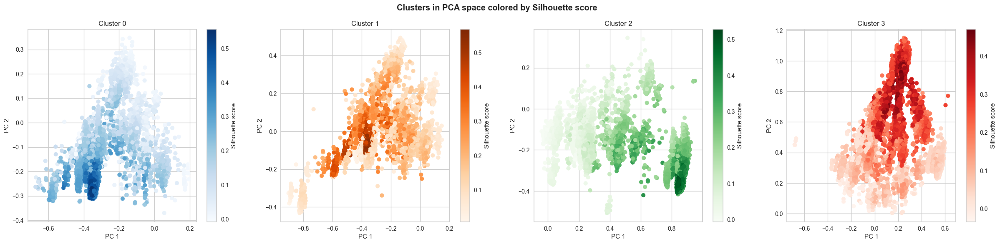

In [47]:
scatter_pca_features_by_score(
    X_pca=X_pca,
    clusters=clusters,
    x_component=1,
    y_component=2,
    score_per_point=silhouette_per_point,
    score_name='Silhouette score',
    cmaps=['Blues', 'Oranges', 'Greens', 'Reds'],
    figsize=(30, 6)
)

In the feature space of the first two principal components, points from cluster 1 are not well separated by their sihlouette score.

We plot now the first and third principal components:

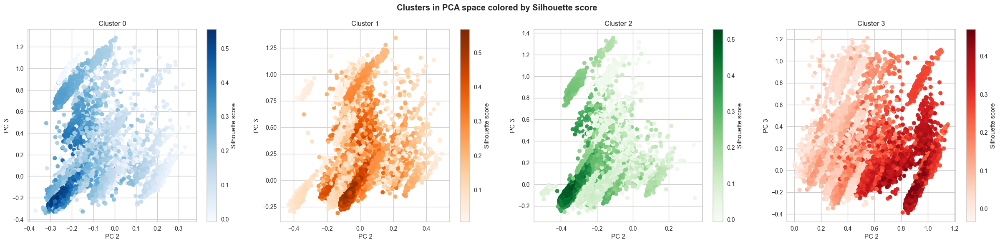

In [48]:
scatter_pca_features_by_score(
    X_pca=X_pca,
    clusters=clusters,
    x_component=2,
    y_component=3,
    score_per_point=silhouette_per_point,
    score_name='Silhouette score',
    cmaps=['Blues', 'Oranges', 'Greens', 'Reds'],
    figsize=(30, 6)
)

In this feature space none of the clusters are well separated by their sihlouette score.

We finally plot the first and third principal components:

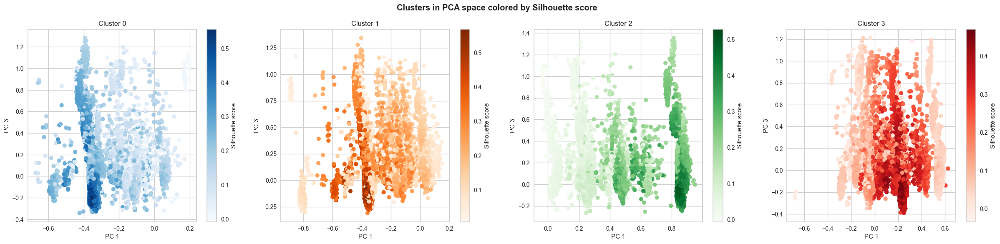

In [49]:
scatter_pca_features_by_score(
    X_pca=X_pca,
    clusters=clusters,
    x_component=1,
    y_component=3,
    score_per_point=silhouette_per_point,
    score_name='Silhouette score',
    cmaps=['Blues', 'Oranges', 'Greens', 'Reds'],
    figsize=(30, 6)
)

In this feature space, cluster 1, again, is not well separated according to the silhouette score.

Now we compute the sum of squared error for each separate feature:

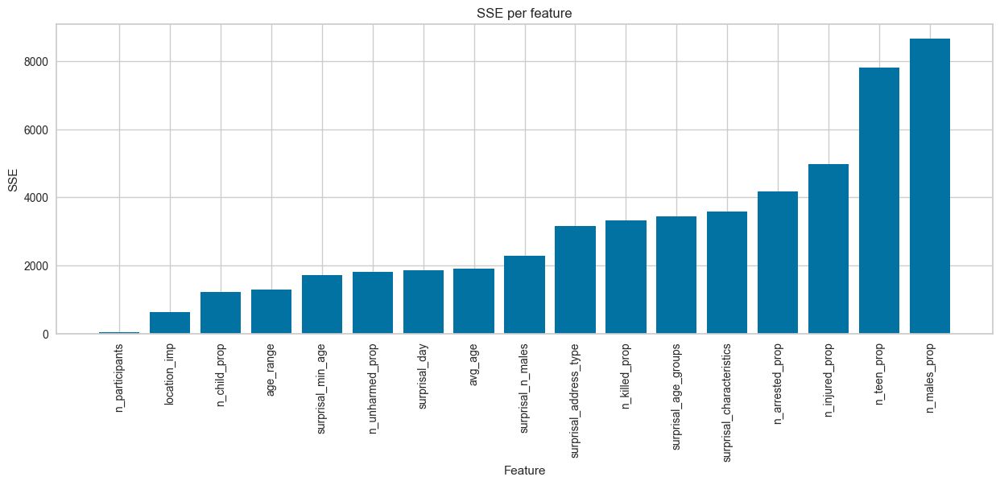

In [50]:
sse_feature = []
for i in range(X.shape[1]):
    sse_feature.append(compute_se_per_point(X=X[:,i], clusters=clusters, centroids=centroids[:,i]).sum())

plt.figure(figsize=(15, 5))
sse_feature_sorted, clustering_features_sorted = zip(*sorted(zip(sse_feature, features_to_cluster)))
plt.bar(range(len(sse_feature_sorted)), sse_feature_sorted)
plt.xticks(range(len(sse_feature_sorted)), clustering_features_sorted)
plt.xticks(rotation=90)
plt.ylabel('SSE')
plt.xlabel('Feature')
plt.title('SSE per feature');

The features that contribute the most to the SSE are n_males_prop and n_teen_prop. The feature that contributes less is n_participants.

We now compute the SSE for each point and display the 5 points with highest SSE.

In [51]:
se_per_point = compute_se_per_point(X=X, clusters=clusters, centroids=centroids)
indices_of_top_contributors = np.argsort(se_per_point)[-5:]
incidents_df.iloc[indices_of_top_contributors]

,date,date_original,year,month,day,day_of_week,state,address,latitude,longitude,county,city,address_type,congd,state_house_district,state_senate_district,px_code,participant_age1,participant1_child,participant1_teen,participant1_adult,participant1_male,participant1_female,min_age,max_age,n_child,n_teen,n_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,notes,incident_characteristics1,incident_characteristics2,firearm,air_gun,shots,aggression,suicide,injuries,death,road,illegal_holding,house,school,children,drugs,officers,organized,social_reasons,defensive,workplace,abduction,unintentional,poverty_perc,party,candidate_votes,total_votes,candidate_perc,population_state_2010,lat_proj,lon_proj,location_imp,surprisal_address_type,age_range,avg_age,surprisal_min_age,log_min_age_mean_ratio,n_child_prop,n_teen_prop,surprisal_age_groups,severity,n_killed_prop,surprisal_n_killed,log_n_killed_mean_ratio,n_injured_prop,log_n_injured_mean_ratio,surprisal_n_injured,n_unharmed_prop,n_males_prop,log_n_males_mean_ratio,surprisal_n_males,surprisal_characteristics,n_arrested_prop,log_n_participants_mean_ratio,surprisal_n_participants,n_participants,surprisal_day,cluster
89853,2014-04-26,2014-04-26,2014.0,4,26,5,GEORGIA,NaN,33.7555,-84.3906,Fulton County,Atlanta,amenity,5.0,57.0,36.0,GA,7.0,True,False,False,False,True,7.0,7.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,"Southwest Atlanta near Cascade Avenue nightclub, stray gunfire outside home, bullet narrowly missed sleeping 7-month-old baby, police believe shots came in front of a nearby nightclub from a high-powered weapon.",Shots Fired - No Injuries,"Shots fired, no action (reported, no evidence found)",True,False,True,True,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,16.8,DEMOCRAT,170326.0,170326.0,100.000000,9687653,741692.850024,3.738106e+06,0.466616,4.104337,0.0,7.0,6.426265,-1.286047,1.0,0.0,6.426265,NaN,0.0,0.448985,0.003328,0.0,0.003328,0.448985,1.0,0.0,0.002256,5.426265,6.426265,0.0,-0.806232,2.426265,1.0,6.426265,3
113279,2017-01-17,2017-01-17,2017.0,1,17,1,ILLINOIS,3700 block of West Ferdinand,41.8902,-87.7188,Cook County,Chicago,building,7.0,10.0,5.0,IL,5.0,True,False,False,False,True,5.0,5.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,"Child shoots self w/ gun from mother's purse; serious; mother charged, misdemeanor child endangerment;",Shot - Wounded/Injured,Accidental Shooting,True,False,True,True,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,True,10.4,DEMOCRAT,250584.0,297466.0,84.239543,12830632,440368.293666,4.637835e+06,0.000010,0.341920,0.0,5.0,9.353147,-1.624426,1.0,0.0,7.768184,0.3,0.0,0.308753,0.003328,1.0,-0.029646,0.615055,0.0,0.0,0.002256,4.829585,9.353147,0.0,-0.583002,1.119527,1.0,6.768184,0
109349,2014-04-30,2014-04-30,2014.0,4,30,2,SOUTH CAROLINA,NaN,32.2860,-80.7214,Beaufort County,NaN,county,1.0,123.0,46.0,SC,12.0,False,True,False,False,True,12.0,12.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,NaN,"Shot - Dead (murder, accidental, suicide)",Suicide^,True,False,True,False,True,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,14.9,REPUBLICAN,119392.0,127815.0,93.410007,4625364,526233.291331,3.572171e+06,0.475885,6.303781,0.0,12.0,6.303781,-0.761491,0.0,1.0,5.303781,0.7,1.0,2.303781,1.597534,0.0,0.003328,0.373043,0.0,0.0,0.002256,6.303781,6.303781,0.0,-0.785174,2.216318,1.0,6.303781,2
116805,2014-07-19,2014-07-19,2014.0,7,19,5,CALIFORNIA,12th and Filbert,37.8074,-122.2830,Alameda County,Oakland,amenity,13.0,18.0,9.0,CA,10.0,True,False,False,False,True,10.0,10.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,NaN,Shot - Wounded/Injured,NaN,True,False,True,True,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,14.5,DEMOCRAT,168491.0,190431.0,88.478767,37253956,563115.378637,4.184688e+06,0.000010,3.543543,0.0,10.0,9.271463,-1.038644,1.0,0.0,8.271463,0.3,0.0,0.104045,0.003328,1.0,2.192754,3.464108,0.0,0.0,0.002256

These incidents share the commonality of involving a female child or teen.

We now visualize the SSE for each point:

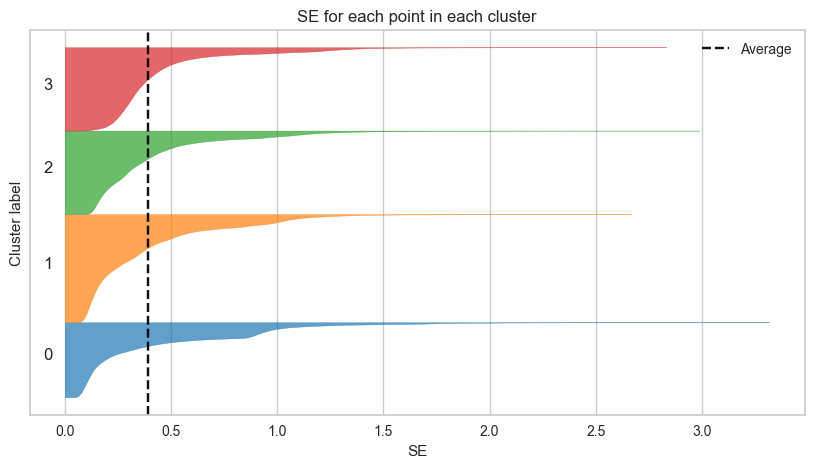

In [52]:
fig, axs = plt.subplots(1, figsize=(10,5))
plot_scores_per_point(
    score_per_point=se_per_point,
    clusters=clusters,
    score_name='SE',
    ax=axs,
    color_palette=sns.color_palette('tab10'),
    minx=-0.1
)

Points with the highest SSE are in cluster 0. SSE in cluster 3 (the cluster containing points with negative silhouette score) is not higher than in the other clusters.

We now compute cohesion (SSE) and separation (BSS) for each cluster and visualize it:

Text(0.5, 0.98, 'Cohesion and separation measures for each cluster')

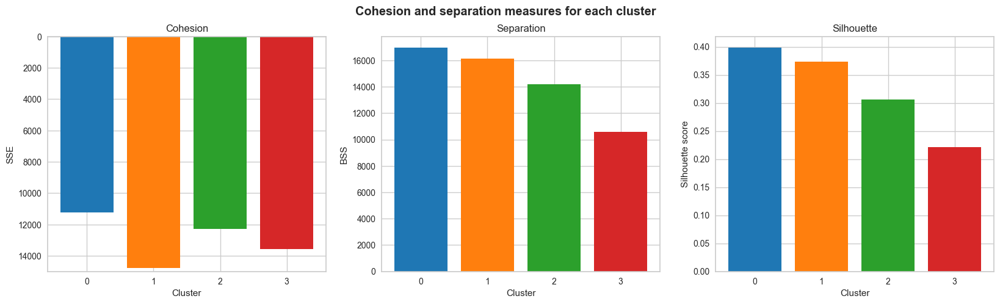

In [53]:
# compute cohesion for each cluster
se_per_cluster = np.zeros(k)
sizes = np.ones(centroids.shape[0])
for i in range(k):
    se_per_cluster[i] = np.sum(se_per_point[np.where(clusters == i)[0]])/sizes[i]
# compute separation for each cluster
bss_per_cluster = compute_bss_per_cluster(X, clusters, centroids, weighted=True)
# compute average silhouette score for each cluster
silhouette_per_cluster = np.zeros(k)
for i in range(k):
    silhouette_per_cluster[i] = silhouette_per_point[np.where(clusters == i)[0]].mean()
# visualize the result
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(20,5))
axs[0].bar(range(k), se_per_cluster, color=sns.color_palette('tab10'))
axs[0].set_ylim(15000, 0)
axs[0].set_title('Cohesion')
axs[0].set_ylabel('SSE')
axs[1].bar(range(k), bss_per_cluster, color=sns.color_palette('tab10'))
axs[1].set_title('Separation')
axs[1].set_ylabel('BSS')
axs[2].bar(range(k), silhouette_per_cluster, color=sns.color_palette('tab10'))
axs[2].set_title('Silhouette')
axs[2].set_ylabel('Silhouette score')

for i in range(3):
    axs[i].set_xlabel('Cluster')
    axs[i].set_xticks(range(k))
    axs[i].set_xticklabels(range(k))

plt.suptitle('Cohesion and separation measures for each cluster', fontweight='bold')

Cluster 0 is the less cohesive but it is the most separated. Cluster 1 is both cohesive and well separated. Cluster 3 is the lowest separated (this was also evident from the silhouette score).

To evaluate the separation we also display an embedding of the cluster centers in 2 dimensions, using the implementation of [Yellowbrick](https://www.scikit-yb.org/en/latest/index.html):

c:\Users\lucam\anaconda3\envs\python3115\Lib\site-packages\sklearn\manifold\_mds.py:298: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



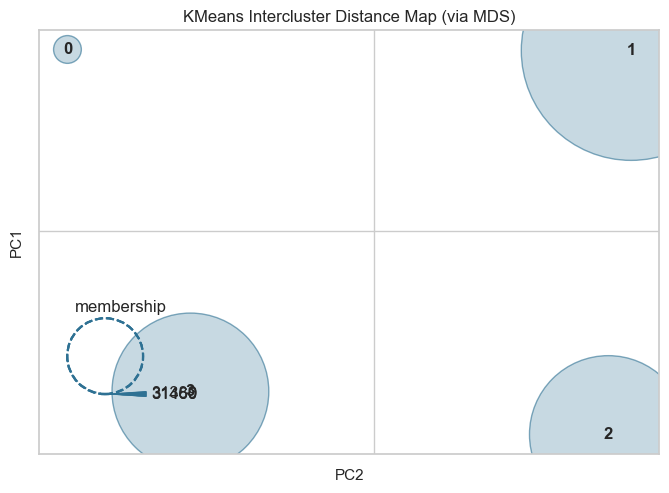

<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>

In [54]:
visualizer = InterclusterDistance(kmeans)
visualizer.fit(X)
visualizer.show()

Clusters are well separated.

We visualize the distance matrix sorted by cluster computed on a stratified subsample of 5000 points:

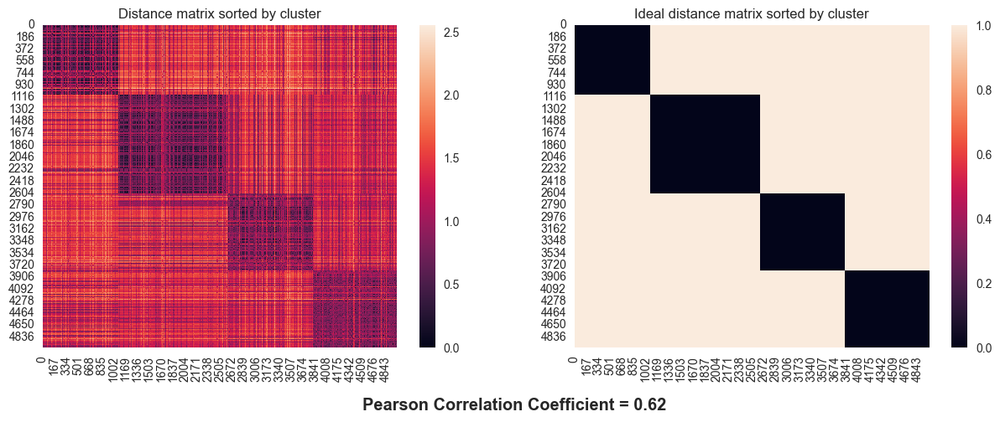

In [55]:
dm, idm = plot_distance_matrices(X=X, n_samples=5000, clusters=clusters, random_state=RANDOM_STATE)

The pearson correlation coefficient between the two matrix is 0.62. Indeed, the matrix has a sharp block diagonal structure, meaning that clusters are well separated.

### External indices

We measure the extent to which the discovered clustering structure matches some categorical features of the dataset, using the following permutation invariant scores:
- **Adjusted rand score**: this score computes a similarity measure between two clusterings by considering all pairs of samples and counting pairs that are assigned in the same or different clusters in the predicted and true clusterings. It is 0.0 for random labeling, 1.0 when the clusterings are identical and is bounded below by -0.5 for especially discordant clusterings.
- **Normalized mutual information**: is a normalization of the Mutual Information (MI) score to scale the results between 0 (no mutual information) and 1 (perfect correlation). Mutual Information is a function that measures the agreement of the two assignments, ignoring permutations.
- **Homogeneity**: measure the degree to which each cluster contains only members of a single class; it ranges between 0 and 1, with 1 denoting perfectly homogeneous labeling.
- **Completeness**: measure the degree to ewhich data points that are members of a given class are also elements of the same cluster; it ranges between 0 and 1, with 1 denoting perfectly complete labeling.

In [56]:
incidents_df['unharmed'] = incidents_df['n_unharmed'] > 0
incidents_df['arrested'] = incidents_df['n_arrested'] > 0
incidents_df['males'] = incidents_df['n_males'] > 0
incidents_df['females'] = incidents_df['n_females'] > 0
external_scores_df = compute_permutation_invariant_external_metrics(
    incidents_df,
    'cluster',
    ['shots', 'aggression', 'suicide', 'injuries', 'death', 'drugs', 'illegal_holding', 'unharmed', 'arrested', 'males', 'females']
)
external_scores_df

,adjusted rand score,normalized mutual information,homogeneity,completeness
feature,,,,
shots,0.066960,0.178677,0.316218,0.124518
aggression,0.129628,0.171629,0.257839,0.128623
suicide,0.005059,0.041971,0.250608,0.022903
injuries,0.192134,0.249401,0.376695,0.186409
death,0.286169,0.389875,0.622494,0.283816
drugs,-0.003387,0.056488,0.166964,0.033995
illegal_holding,-0.000474,0.040465,0.102789,0.025191
unharmed,0.313347,0.492696,0.843059,0.348051
arrested,0.324981,0.382347,0.576628,0.285990


The category that best matches the clustering is 'unharmed' followed by 'death' and 'arrested'. The most homogeneous category is 'unharmed', and it is also the most complete. However, completeness is quite low for all the categories.

We save the clustering labels and scores for later use:

In [57]:
write_clusters_to_csv(clusters, f'../data/clustering_labels/{k}-Means_clusters.csv')
results_df.loc[f'{k}means'].to_csv(f'../data/clustering_labels/{k}-Means_internal_scores.csv')
external_scores_df.to_csv(f'../data/clustering_labels/{k}-Means_external_scores.csv')

## Final considerations

Advantages of K-means:
- Is computationally efficient and can be used on large datasets (as the one we used); if using the euclidean distance it converges quickly
- Is restricted to data for which there is a notion of centroid

Disadvantages:
- To run the algorithm the number of clusters must be known a priori
- It finds clusters with globular shapes, therefore does not work with clusters of differing sizes or densities
- Is affected by outliers
- The resulting clustering could vary depending on the initialization of the centroids. One approach to mitigate this problem is to initialize the centroids with the final centroids computed by BisectingKMeans. In the following we will use this approach.

In [58]:
bisect_kmeans = BisectingKMeans(n_clusters=k, n_init=10, init=INIT_METHOD, random_state=RANDOM_STATE).fit(X)
params = {'n_clusters': k, 'n_init': 1, 'init': bisect_kmeans.cluster_centers_, 'random_state': RANDOM_STATE}
result = fit_kmeans(X, params)
results[str(k)+'means_bis_init'] = result
results_df = pd.DataFrame(results).T
results_df.drop(columns=['model'])

Fitting KMeans with k=4


,SSE,BSS,davies_bouldin_score,calinski_harabasz_score,silhouette_score,n_iter
4means,51878.798453,57863.918708,1.212993,49004.186717,0.326803,6
5means,47210.942099,62529.604692,1.456076,43644.701959,0.299111,6
7means,40894.919606,68847.354336,1.397458,36982.510661,0.302721,21
4means_bis_init,51894.289416,57847.077372,1.188819,48976.443844,0.330212,4


We observe a slight improvement in the Davies-Bouldin score and in the silhouette score. The other metrics do not improve. The repeated execution with different initializations already addressed the problem of the instability of the results.